In [2]:
import requests
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose

import seaborn as sns

Importamos las librerías que vamos a ir usando en el desarrollo de EDA

In [3]:
def download_covid_data(url, filename):
    # Enviar una solicitud GET a la URL
    response = requests.get(url)

    # Verificar si la solicitud fue exitosa
    if response.status_code == 200:
        # Escribir el contenido en un archivo
        with open(filename, 'wb') as file:
            file.write(response.content)
        print(f"Archivo descargado con éxito: {filename}")
    else:
        print(f"Fallo en la descarga del archivo. Código : {response.status_code}")


url = 'https://api.covidtracking.com/v1/states/daily.csv'
filename = 'us_daily_state_covid_data.csv'
download_covid_data(url, filename)

Archivo descargado con éxito: us_daily_state_covid_data.csv


Función para descargarnos el archivo sobre el que vamos a trabajar

Leemos el archivo csv, y sacamos una primera información básica sobre los datos, como el nombre de las columnas,el número total de filas, tipo de datos....

In [4]:
df = pd.read_csv('us_daily_state_covid_data.csv')

# Mostrar información básica sobre el DataFrame
print("Información del DataFrame:")
df.info()

print("\nForma del DataFrame:")
print(f"Número de filas: {df.shape[0]}")
print(f"Número de columnas: {df.shape[1]}")

print("\nNombres de las columnas:")
print(df.columns.tolist())

print("\nPrimeras filas del DataFrame:")
print(df.head())

print("\nEstadísticas resumidas:")
print(df.describe())

Información del DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  int64  
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   fl

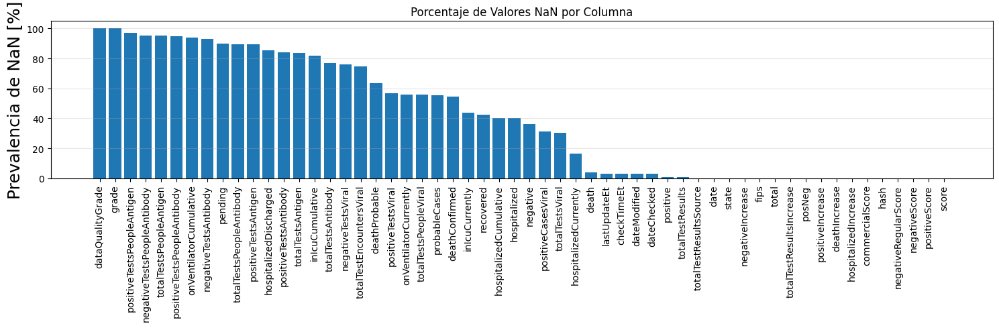

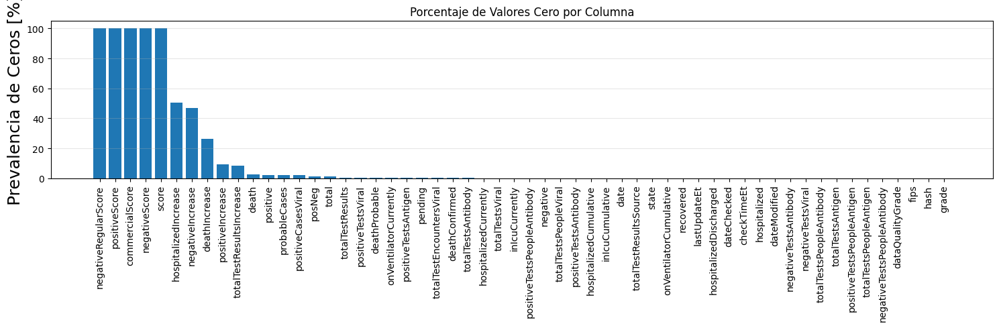

In [5]:
# Calcular el porcentaje de NaN y ceros
total_nans = df.isnull().sum().sort_values(ascending=False)
percent_nans = (df.isnull().sum() / df.isnull().count() * 100).sort_values(ascending=False)
total_zeros = df.isin([0]).sum().sort_values(ascending=False)
percent_zeros = (df.isin([0]).sum() / df.isin([0]).count() * 100).sort_values(ascending=False)

# Crear DataFrames para estadísticas de NaN y ceros
df_nans = pd.concat([total_nans, percent_nans], axis=1, keys=['Total NaN', 'Porcentaje NaN'])
df_zeros = pd.concat([total_zeros, percent_zeros], axis=1, keys=['Total Ceros', 'Porcentaje Ceros'])


# Graficar porcentajes de NaN
plt.figure(figsize=(15, 5))
plt.bar(np.arange(len(df_nans)), df_nans['Porcentaje NaN'].values)
plt.xticks(np.arange(len(df_nans)), df_nans.index, rotation='vertical')
plt.ylabel('Prevalencia de NaN [%]', fontsize=18)
plt.title('Porcentaje de Valores NaN por Columna')
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()
plt.close()

# Graficar porcentajes de Ceros
plt.figure(figsize=(15, 5))
plt.bar(np.arange(len(df_zeros)), df_zeros['Porcentaje Ceros'].values)
plt.xticks(np.arange(len(df_zeros)), df_zeros.index, rotation='vertical')
plt.ylabel('Prevalencia de Ceros [%]', fontsize=18)
plt.title('Porcentaje de Valores Cero por Columna')
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

En el gráfico de barras anterior, observamos como los valores NaN y '0' para algunas colmunas son bastante elevados.

Hacemos una filtración del df con las columnas que nos parecen más interesantes para analizar

In [6]:
# Lista de columnas relevantes
relevant_columns = ['date', 'state', 'fips', 'positiveIncrease', 'negativeIncrease', 'total', 'totalTestResultsIncrease',
                 'posNeg', 'totalTestResultsSource', 'hospitalizedIncrease', 'hash', 'positiveScore', 'negativeScore',
                 'commercialScore', 'negativeRegularScore', 'score', 'deathIncrease', 'totalTestResults', 'positive',
                 'checkTimeEt', 'dateChecked', 'dateModified', 'lastUpdateEt', 'death', 'hospitalizedCurrently']


# Nos quedamos con esas columnas para el análisis
df_clean = df[relevant_columns]


Convertimos los valores de la fecha a datatime y lo ordenamos por fecha

In [7]:
# Convertir la fecha a datetime
df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')

# Ordenar por fecha
df = df.sort_values('date')
df.reset_index(drop= True, inplace=True)

In [8]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.palettes import Spectral11
import itertools

# Activar la salida en Jupyter
output_notebook()

# Filtrar y preparar los datos

df_grouped = df.groupby(['date', 'state'])['positive'].sum().reset_index()

# Crear una fuente de datos
source = ColumnDataSource(df_grouped)

# Crear el gráfico
p = figure(x_axis_type='datetime', title='Evolución de Casos Positivos de COVID-19 en EE.UU.',
           height=400, width=900)

# Añadir una línea por cada estado
estados = df['state'].unique()
# Generar una paleta de colores personalizada para más de 20 estados
colors = list(itertools.islice(itertools.cycle(Spectral11), len(estados)))

for i, estado in enumerate(estados):
    estado_df = df_grouped[df_grouped['state'] == estado]
    p.line('date', 'positive', source=ColumnDataSource(estado_df), legend_label=estado, line_width=2, color=colors[i])

# Configuración del hover tool
hover = HoverTool(tooltips=[('Fecha', '@date{%F}'), ('Positivos', '@positive{0,0}'), ('Estado', '@state')],
                  formatters={'@date': 'datetime'})
p.add_tools(hover)

p.legend.location = 'top_left'
p.xaxis.axis_label = 'Fecha'
p.yaxis.axis_label = 'Número de Casos Positivos'

show(p)

Loading BokehJS ...

Este gráfico de líneas de tiempo muestra la evolución de los casos positivos en todos los estados seleccionados. Al pasar el cursor sobre cualquier punto de las líneas, se muestra la fecha exacta y el número de casos positivos.
Cabe destacar como fluctuan los positivos sobre todo en los estados de CA,TX,NY,FL, que son los que aparentemente sufren diferentes olas de incremento de personas positivas en COVID.

In [9]:
#Visualizar la distribución de casos positivos por estado en un mapa de EE.UU.
import plotly.express as px

# Agrupar los datos por estado y sumar los casos positivos
df_state_sum = df.groupby('state').agg({'positive': 'sum'}).reset_index()

# Crear un mapa coroplético
fig = px.choropleth(df_state_sum, locations='state', locationmode="USA-states", color='positive',
                    color_continuous_scale="Viridis", scope="usa",
                    labels={'positive': 'Casos Positivos'},
                    title="Distribución de Casos Positivos de COVID-19 en EE.UU.")

fig.update_layout(geo=dict(bgcolor= 'rgba(0,0,0,0)'))
fig.show()


Gráfico de mapa coroplético:
Nos representa en forma de mapa de calor y muy visual los estados y el numero de casos positivos que ha habido en total durante todo el estudio.



In [10]:
# Agregar los datos a nivel nacional
national_df = df.groupby('date').agg({
    'positiveIncrease': 'sum',
    'deathIncrease': 'sum',
    'totalTestResultsIncrease': 'sum',
    'hospitalizedIncrease': 'sum',
    'positive': 'sum',
    'death': 'sum',
    'total': 'sum',
    'hospitalizedCurrently': 'sum'
}).reset_index()

# Calcular estadísticas diarias
national_df['daily_positivity_rate'] = national_df['positiveIncrease'] / national_df['totalTestResultsIncrease']
national_df['daily_death_rate'] = national_df['deathIncrease'] / national_df['positiveIncrease']



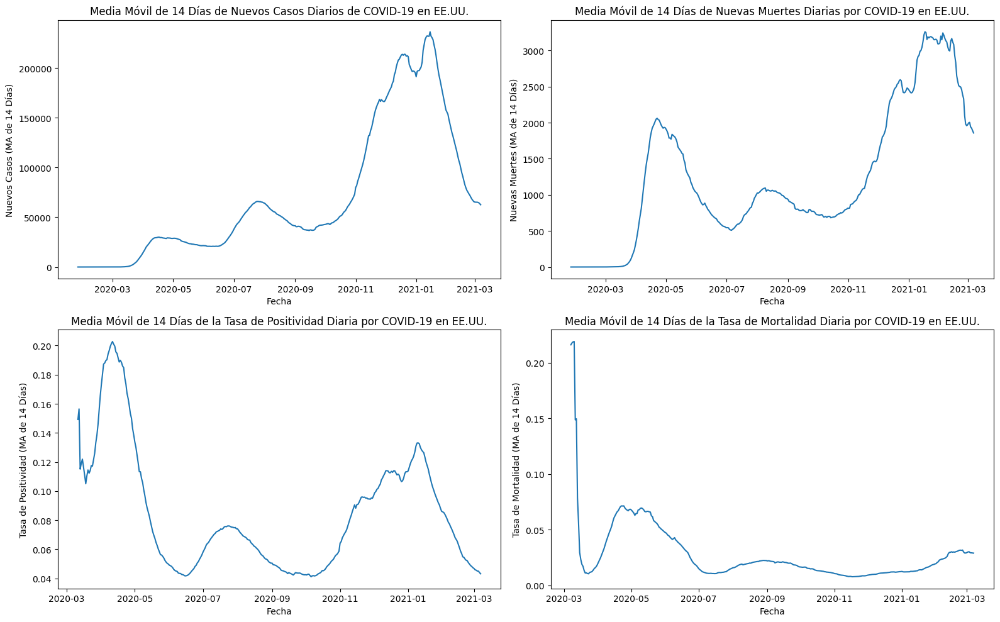

In [11]:
# Calcular medias móviles de 14 períodos
national_df['positiveIncrease_MA'] = national_df['positiveIncrease'].rolling(window=14).mean()
national_df['deathIncrease_MA'] = national_df['deathIncrease'].rolling(window=14).mean()
national_df['daily_positivity_rate_MA'] = national_df['daily_positivity_rate'].rolling(window=14).mean()
national_df['daily_death_rate_MA'] = national_df['daily_death_rate'].rolling(window=14).mean()

# Graficar medias móviles de 14 períodos de las tendencias nacionales
fig, axs = plt.subplots(2, 2, figsize=(16, 10))

# Nuevos casos (media móvil de 14 días)
axs[0, 0].plot(national_df['date'], national_df['positiveIncrease_MA'])
axs[0, 0].set_title('Media Móvil de 14 Días de Nuevos Casos Diarios de COVID-19 en EE.UU.')
axs[0, 0].set_xlabel('Fecha')
axs[0, 0].set_ylabel('Nuevos Casos (MA de 14 Días)')

# Nuevas muertes (media móvil de 14 días)
axs[0, 1].plot(national_df['date'], national_df['deathIncrease_MA'])
axs[0, 1].set_title('Media Móvil de 14 Días de Nuevas Muertes Diarias por COVID-19 en EE.UU.')
axs[0, 1].set_xlabel('Fecha')
axs[0, 1].set_ylabel('Nuevas Muertes (MA de 14 Días)')

# Tasa de positividad (media móvil de 14 días)
axs[1, 0].plot(national_df['date'], national_df['daily_positivity_rate_MA'])
axs[1, 0].set_title('Media Móvil de 14 Días de la Tasa de Positividad Diaria por COVID-19 en EE.UU.')
axs[1, 0].set_xlabel('Fecha')
axs[1, 0].set_ylabel('Tasa de Positividad (MA de 14 Días)')

# Tasa de mortalidad (media móvil de 30 días)
axs[1, 1].plot(national_df['date'], national_df['daily_death_rate_MA'])
axs[1, 1].set_title('Media Móvil de 14 Días de la Tasa de Mortalidad Diaria por COVID-19 en EE.UU.')
axs[1, 1].set_xlabel('Fecha')
axs[1, 1].set_ylabel('Tasa de Mortalidad (MA de 14 Días)')

plt.tight_layout()
plt.show()

- El análisis revela fluctuaciones en los nuevos casos y muertes diarias a lo largo del tiempo.
- Las medias móviles de 14 días muestran tendencias más claras, suavizando las variaciones diarias.
- Las múltiples olas de infecciones vienen indicadas por picos en las medias móviles.

Text(0, 0.5, 'Muertes Totales')

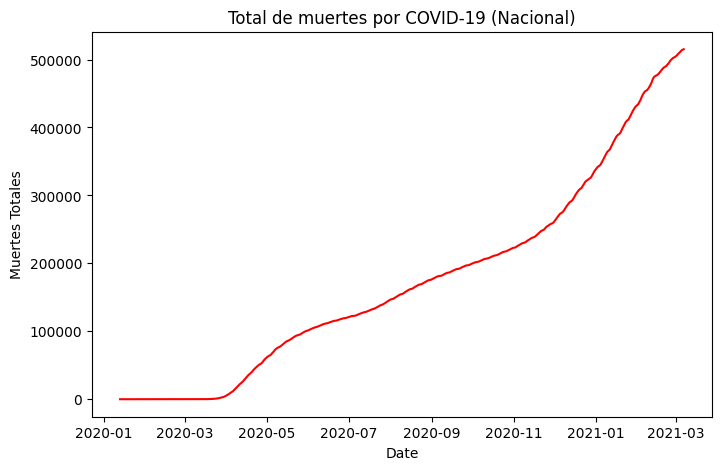

In [12]:
# Totales acumulados
national_df['total_deaths'] = national_df['deathIncrease'].cumsum()
national_df['total_hospitalizations'] = national_df['hospitalizedIncrease'].cumsum()

# Graficamos
fig, ax = plt.subplots(1, 1, figsize=(8, 5))

# Muertes totales
ax.plot(national_df['date'], national_df['total_deaths'], color='red')
ax.set_title('Total de muertes por COVID-19 (Nacional)')
ax.set_xlabel('Date')
ax.set_ylabel('Muertes Totales')




En este gráfico podemos observar el total de muertes acumuladas a nivel nacional durante todo el estudio.
En Marzo de 2021 se acumularon más de 500.000 muertes desde enero de 2021 en todos los estados.

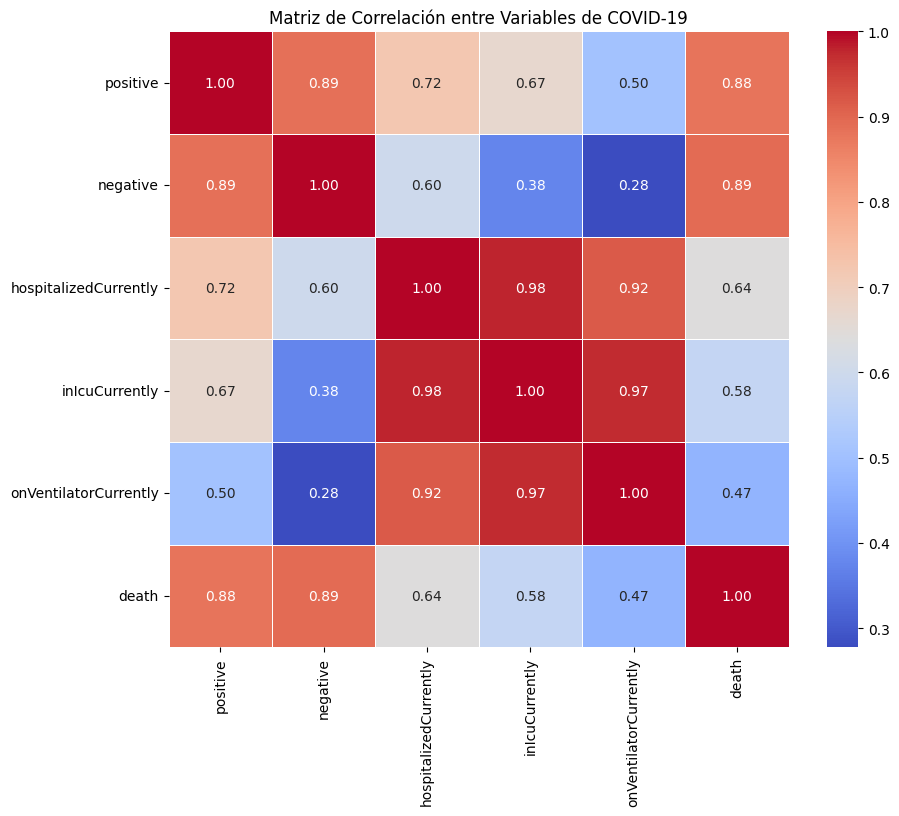

In [13]:
# Seleccionar las columnas de interés
columnas_interes = ['positive', 'negative', 'hospitalizedCurrently', 'inIcuCurrently', 'onVentilatorCurrently', 'death']

# Crear un DataFrame filtrado con las columnas de interés
df_filtrado = df[columnas_interes]

# Calcular la matriz de correlación
matriz_correlacion = df_filtrado.corr()

# Visualizar la matriz de correlación usando un mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlación entre Variables de COVID-19')
plt.show()

En esta matriz de correlación hemos añadido algunas variables que nos han resultado interesante de analizar:
-Valores cercanos a 1: Indican una correlación positiva fuerte entre dos variables (cuando una aumenta, la otra también tiende a aumentar).
-Valores cercanos a -1: Indican una correlación negativa fuerte (cuando una aumenta, la otra tiende a disminuir).
-Valores cercanos a 0: Indican poca o ninguna correlación entre las variables.

## Conclusiones Clave

1. **Tres Olas**: Los datos sugieren que EE.UU. experimentó tres olas de infecciones por COVID-19 en el periodo analizado , siendo la tercera de mayor intensidad en contagios y muertes totales. Sugiere fallos de planificación y adaptación del sistema sanitario ya que había precedentes. La mortalidad de la primera ola fue lógicamente la mas elevada.

2. **Impacto Variable**: Las fluctuaciones en las tasas de positividad, mortalidad y hospitalización indican que el impacto del COVID-19 varió con el tiempo, debido a factores como medidas de salud pública, adaptaciones del sistema de salud y variantes del virus.

4. **Estrés en el Sistema de Salud**: Las variaciones en las tasas de hospitalización sugieren períodos de mayor estrés en el sistema de salud, lo que puede haber influido en los resultados de los pacientes.

5. **Datos incompletos**: Algunas variaciones y anomalías en los datos podrían deberse a inconsistencias o retrasos en los informes y diferentes políticas de gestión a nivel estatal.
El dataset contiene muchas columnas en desuso que han sido limpiadas


# Análisis a nivel Estatal

In [14]:
# Agrupar los datos por estado y fecha
state_df = df.groupby(['state', 'date']).sum().reset_index()

# Calcular estadísticas resumidas para cada estado
state_summary = state_df.groupby('state').agg({
    'positiveIncrease': 'sum',
    'totalTestResultsIncrease': 'sum',
    'positive': 'max',
    'death': 'max',
    'total': 'sum',
    'positiveIncrease': 'sum',
    'deathIncrease': 'sum',
    'hospitalizedCurrently': 'max',
    'hospitalizedIncrease': 'sum',
}).reset_index()

In [15]:
state_summary['death'].sum()

np.float64(515254.0)

In [16]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.palettes import Category20

# Activar la salida en Jupyter
output_notebook()

# Filtrar datos para los estados más afectados
estados_seleccionados = df['state'].unique()[:20]
df_filtrado = df[df['state'].isin(estados_seleccionados)]

# Crear la figura
p = figure(x_axis_type="datetime", title="Evolución de Casos Positivos y Muertes en Estados Unidos",
           height=600, width=1000)

# Colores para cada estado
colors = Category20[20]

# Graficar la evolución de casos positivos y muertes
for i, estado in enumerate(estados_seleccionados):
    df_estado = df_filtrado[df_filtrado['state'] == estado]

    # Crear una fuente de datos para cada estado
    source = ColumnDataSource(data={
        'date': df_estado['date'],
        'positive': df_estado['positive'],
        'death': df_estado['death'],
        'state': [estado] * len(df_estado)  # Añadir el nombre del estado
    })

    p.line('date', 'positive', source=source, color=colors[i], legend_label=estado, line_width=2)
    p.scatter('date', 'death', source=source, color=colors[i], size=4)

# Configurar leyendas y herramientas
p.legend.location = "top_left"
p.add_tools(HoverTool(
    tooltips=[("Estado", "@state"), ("Positivos", "@positive"), ("Muertes", "@death"), ("Fecha", "@date{%F}")],
    formatters={'@date': 'datetime'},
    mode='vline'
))

# Mostrar el gráfico
show(p)


Loading BokehJS ...

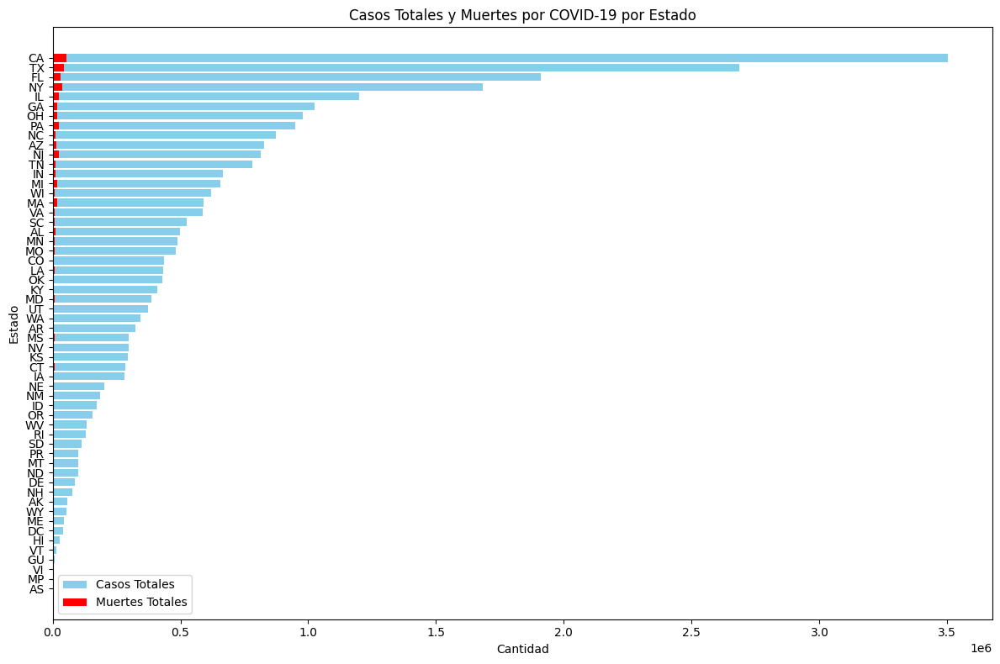

In [17]:
# Ordenar el DataFrame state_summary por la columna 'positive' en orden descendente
state_summary_sorted = state_summary.sort_values(by='positive', ascending=True)

# Graficar casos totales y muertes por estado en orden descendente
plt.figure(figsize=(12, 8))
plt.barh(state_summary_sorted['state'], state_summary_sorted['positive'], color='skyblue', label='Casos Totales')
plt.barh(state_summary_sorted['state'], state_summary_sorted['death'], color='red', label='Muertes Totales')
plt.title('Casos Totales y Muertes por COVID-19 por Estado')
plt.xlabel('Cantidad')
plt.ylabel('Estado')
plt.legend()
plt.tight_layout()
plt.show()
plt.close()


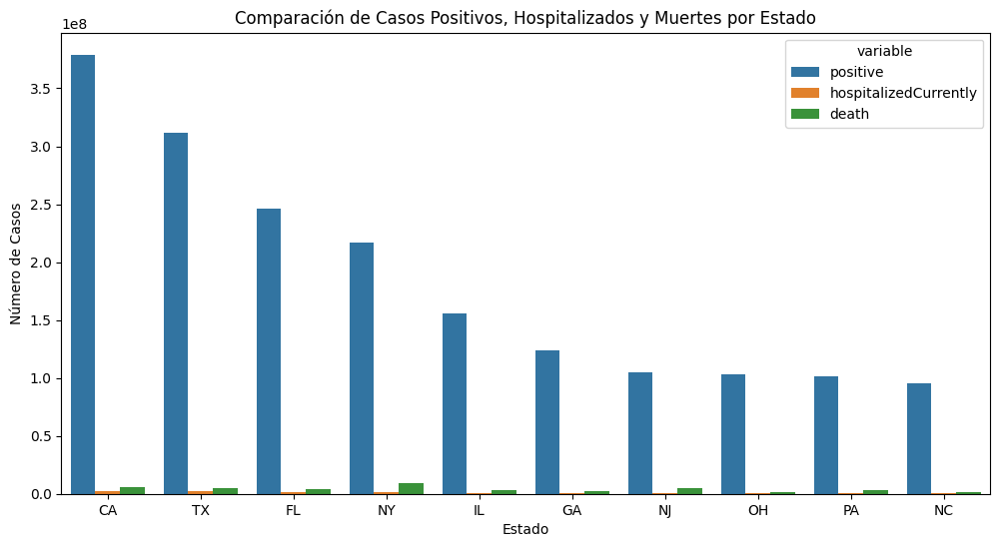

In [18]:
# Filtrar los datos para los estados más afectados
df_top_states = df.groupby('state').agg({'positive': 'sum', 'hospitalizedCurrently': 'sum', 'death': 'sum'}).reset_index()
df_top_states = df_top_states.sort_values('positive', ascending=False).head(10)

plt.figure(figsize=(12, 6)) 
# Crear el gráfico de barras apiladas
df_top_states_melt = df_top_states.melt(id_vars=['state'], value_vars=['positive', 'hospitalizedCurrently', 'death'])
sns.barplot(x='state', y='value', hue='variable', data=df_top_states_melt)
plt.title('Comparación de Casos Positivos, Hospitalizados y Muertes por Estado')
plt.xlabel('Estado')
plt.ylabel('Número de Casos')

plt.show()





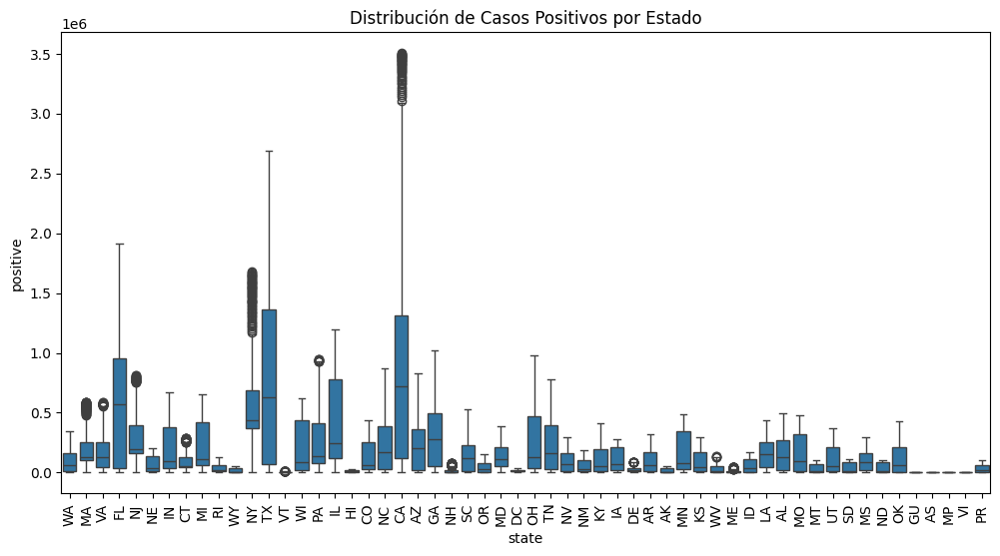

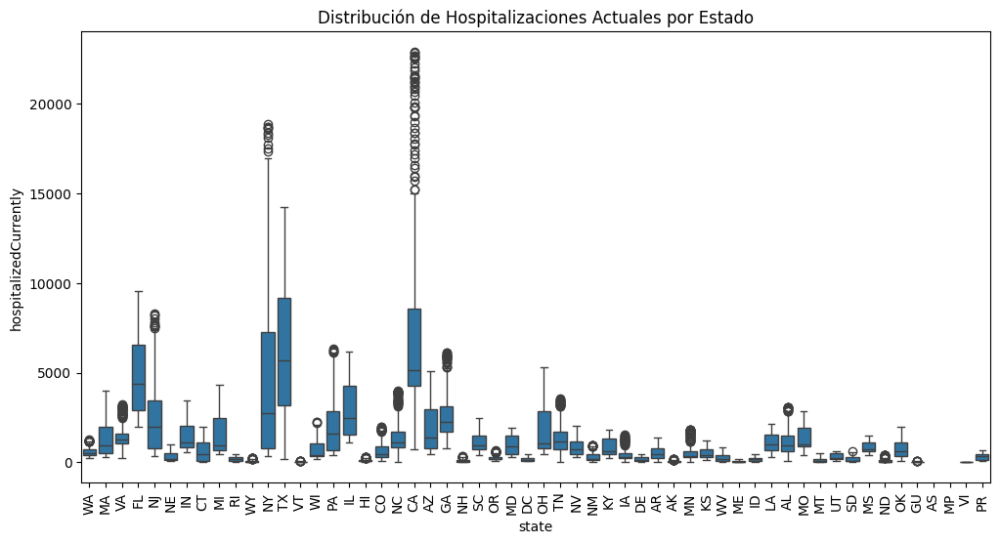

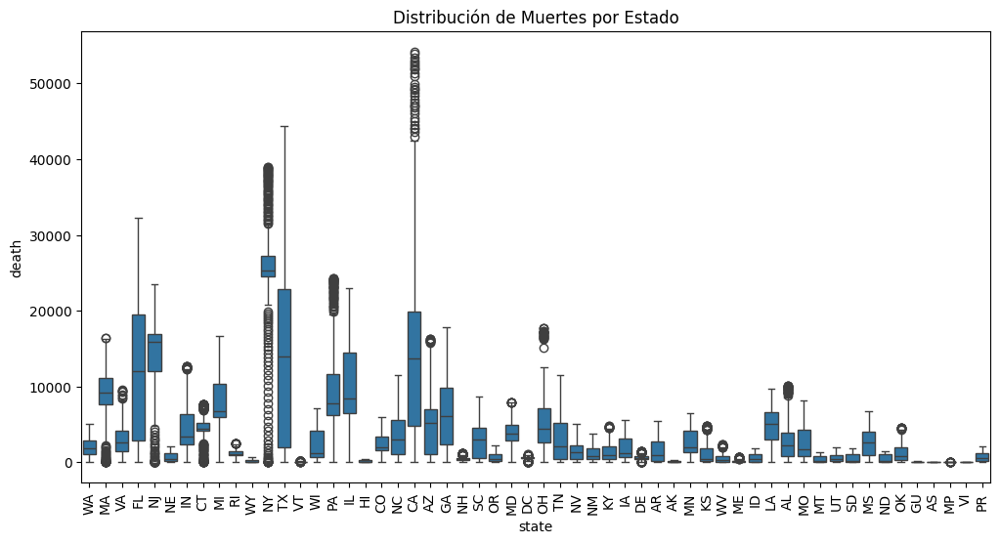

In [19]:
# Seleccionar las columnas relevantes
df_filtrado = df[['state', 'positive', 'negative', 'hospitalizedCurrently', 'death']]

# Crear un gráfico de box plot para los casos positivos
plt.figure(figsize=(12, 6))
sns.boxplot(x='state', y='positive', data=df_filtrado)
plt.title('Distribución de Casos Positivos por Estado')
plt.xticks(rotation=90)
plt.show()

# Crear un gráfico de box plot para las hospitalizaciones actuales
plt.figure(figsize=(12, 6))
sns.boxplot(x='state', y='hospitalizedCurrently', data=df_filtrado)
plt.title('Distribución de Hospitalizaciones Actuales por Estado')
plt.xticks(rotation=90)
plt.show()

# Crear un gráfico de box plot para las muertes
plt.figure(figsize=(12, 6))
sns.boxplot(x='state', y='death', data=df_filtrado)
plt.title('Distribución de Muertes por Estado')
plt.xticks(rotation=90)
plt.show()

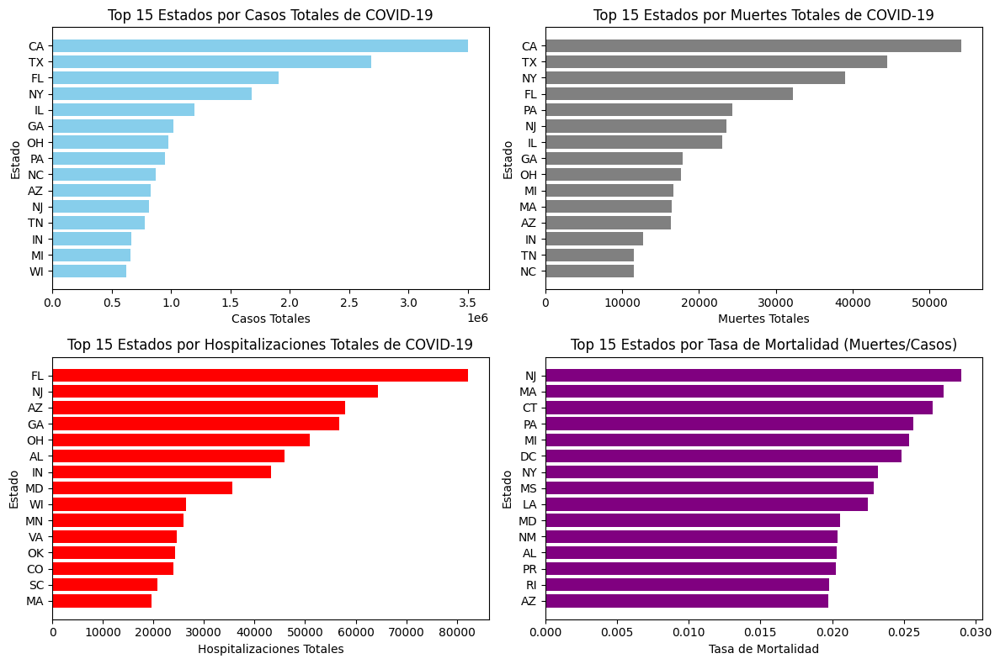

In [20]:
# Añadimos la columna de mortalidad al resumen por estados
state_summary['mortality_rate'] = state_summary['death'] / state_summary['positive']

# Calcular los 15 principales estados por casos totales, muertes y hospitalizaciones
top_cases = state_summary.nlargest(15, 'positive').sort_values(by='positive', ascending=True)
top_deaths = state_summary.nlargest(15, 'death').sort_values(by='death', ascending=True)
top_hospitalizations = state_summary.nlargest(15, 'hospitalizedIncrease').sort_values(by='hospitalizedIncrease', ascending=True)

# Calcular la tasa de mortalidad (muertes/casos) para los principales estados por mortalidad
top_mortality = state_summary.nlargest(15, 'mortality_rate').sort_values(by= 'mortality_rate', ascending=True)


# Configurar una figura con subgráficas 2x2
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Graficar los 10 principales estados por casos totales
axs[0, 0].barh(top_cases['state'], top_cases['positive'], color='skyblue')
axs[0, 0].set_title('Top 15 Estados por Casos Totales de COVID-19')
axs[0, 0].set_xlabel('Casos Totales')
axs[0, 0].set_ylabel('Estado')

# Graficar los 10 principales estados por muertes totales
axs[0, 1].barh(top_deaths['state'], top_deaths['death'], color='grey')
axs[0, 1].set_title('Top 15 Estados por Muertes Totales de COVID-19')
axs[0, 1].set_xlabel('Muertes Totales')
axs[0, 1].set_ylabel('Estado')

# Graficar los 10 principales estados por hospitalizaciones
axs[1, 0].barh(top_hospitalizations['state'], top_hospitalizations['hospitalizedIncrease'], color='red')
axs[1, 0].set_title('Top 15 Estados por Hospitalizaciones Totales de COVID-19')
axs[1, 0].set_xlabel('Hospitalizaciones Totales')
axs[1, 0].set_ylabel('Estado')

# Graficar la tasa de mortalidad
axs[1, 1].barh(top_mortality['state'], top_mortality['mortality_rate'], color='purple')
axs[1, 1].set_title('Top 15 Estados por Tasa de Mortalidad (Muertes/Casos)')
axs[1, 1].set_xlabel('Tasa de Mortalidad')
axs[1, 1].set_ylabel('Estado')

plt.tight_layout()
plt.show()



In [21]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.layouts import gridplot

# Activar la salida en Jupyter
output_notebook()

# Crear la fuente de datos
source = ColumnDataSource(df)

# Gráfico de dispersión de Casos Positivos vs. Hospitalizaciones Actuales
p1 = figure(title="Positivos vs. Hospitalizaciones Actuales", height=600, width=600)
p1.scatter('positive', 'hospitalizedCurrently', source=source)
p1.xaxis.axis_label = 'Casos Positivos'
p1.yaxis.axis_label = 'Hospitalizaciones Actuales'

# Gráfico de dispersión de Casos Positivos vs. Muertes
p2 = figure(title="Positivos vs. Muertes", height=600, width=600)
p2.scatter('positive', 'death', source=source)
p2.xaxis.axis_label = 'Casos Positivos'
p2.yaxis.axis_label = 'Muertes'

# Agregar herramientas de hover
hover = HoverTool(tooltips=[("Estado", "@state"), ("Positivos", "@positive"), ("Hospitalizados", "@hospitalizedCurrently"), ("Muertes", "@death")])
p1.add_tools(hover)
p2.add_tools(hover)

# Mostrar los gráficos en un grid
grid = gridplot([[p1, p2]])
show(grid)


Loading BokehJS ...

In [22]:
#Gráfico de Barras Apiladas: compara el número de personas hospitalizadas, en la UCI y en ventiladores en un momento dado.
from bokeh.plotting import figure, show
from bokeh.transform import dodge
from bokeh.models import ColumnDataSource
from bokeh.palettes import Spectral6

# Agrupar por estado y calcular promedios
df_avg = df.groupby('state')[['hospitalizedCurrently', 'inIcuCurrently', 'onVentilatorCurrently']].mean().reset_index()

# Configurar los datos para el gráfico
source = ColumnDataSource(df_avg)

# Crear figura
p = figure(x_range=df_avg['state'], height=600, width = 1050, title="Comparación de Hospitalizaciones, UCI y Respiradores por Estado")

# Graficar barras
p.vbar(x=dodge('state', -0.25, range=p.x_range), top='hospitalizedCurrently', width=0.2, source=source, color=Spectral6[0], legend_label="Hospitalizados")
p.vbar(x=dodge('state', 0.0, range=p.x_range), top='inIcuCurrently', width=0.2, source=source, color=Spectral6[5], legend_label="En UCI")
p.vbar(x=dodge('state', 0.25, range=p.x_range), top='onVentilatorCurrently', width=0.2, source=source, color=Spectral6[4], legend_label="En Respirador")

# Configurar leyenda
p.legend.location = "top_right"
p.xgrid.grid_line_color = None
p.xaxis.major_label_orientation = 1.2

# Mostrar el gráfico
show(p)


In [23]:
#Gráfico de Barras Horizontal:compara la cantidad total de casos positivos con el número total de pruebas realizadas por estado.
from bokeh.plotting import figure, show
from bokeh.transform import factor_cmap

# Agrupar por estado
df_sum = df.groupby('state')[['positive', 'totalTestResults']].sum().reset_index()

# Crear figura
p = figure(y_range=df_sum['state'], height=800, width=1000, title="Comparación de Casos Positivos y Pruebas Totales por Estado")

# Graficar barras horizontales
p.hbar(y='state', right='positive', height=0.4, source=df_sum, color='navy', legend_label="Casos Positivos")
p.hbar(y='state', right='totalTestResults', height=0.2, source=df_sum, color='orange', legend_label="Pruebas Totales")

# Configurar leyenda y etiquetas
p.legend.location = "center_right"
p.xaxis.axis_label = "Número Total"
p.yaxis.axis_label = "Estado"

# Mostrar el gráfico
show(p)


In [24]:
#Gráfico de Líneas:mostrará los incrementos diarios de casos positivos, muertes y hospitalizaciones por estado.
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.palettes import Category20c

output_notebook()  # Para mostrar el gráfico en Jupyter Notebook
df_filtrado = df[['date', 'state', 'positive', 'negative', 'hospitalizedCurrently', 'death', 'positiveIncrease','deathIncrease', 'hospitalizedIncrease']]

# Crear figura
p = figure(x_axis_type="datetime", title="Incrementos Diarios de Casos Positivos, Muertes y Hospitalizaciones",
           height=700, width=1100)

# Colores para cada estado
colors = Category20c[20]

#estados_seleccionados = df['state'].unique()[:5]
estados_seleccionados = ['CA', 'NY', 'TX', 'NJ', 'MA', 'PA']

# Graficar la evolución de incrementos
for i, estado in enumerate(estados_seleccionados):
    df_estado = df_filtrado[df_filtrado['state'] == estado]

    # Crear un ColumnDataSource con la columna del nombre del estado
    source = ColumnDataSource(data={
        'date': df_estado['date'],
        'positiveIncrease': df_estado['positiveIncrease'],
        'deathIncrease': df_estado['deathIncrease'],
        'hospitalizedIncrease': df_estado['hospitalizedIncrease'],
        'estado': [estado] * len(df_estado)  # Columna con el nombre del estado
    })

    p.line('date', 'positiveIncrease', source=source, color=colors[i], legend_label=f"Positivos {estado}", line_width=2)
    p.line('date', 'deathIncrease', source=source, color=colors[i], legend_label=f"Muertes {estado}", line_dash="4 4", line_width=2)
    p.line('date', 'hospitalizedIncrease', source=source, color=colors[i], legend_label=f"Hospitalizaciones {estado}", line_dash="dotdash", line_width=2)

# Configurar leyenda y herramientas
p.legend.location = "top_left"
hover = HoverTool(tooltips=[("Estado", "@estado"), ("Incremento", "$y"), ("Fecha", "@date{%F}")],
                  formatters={'@date': 'datetime'}, mode='vline')
p.add_tools(hover)

# Mostrar el gráfico
show(p)



Loading BokehJS ...

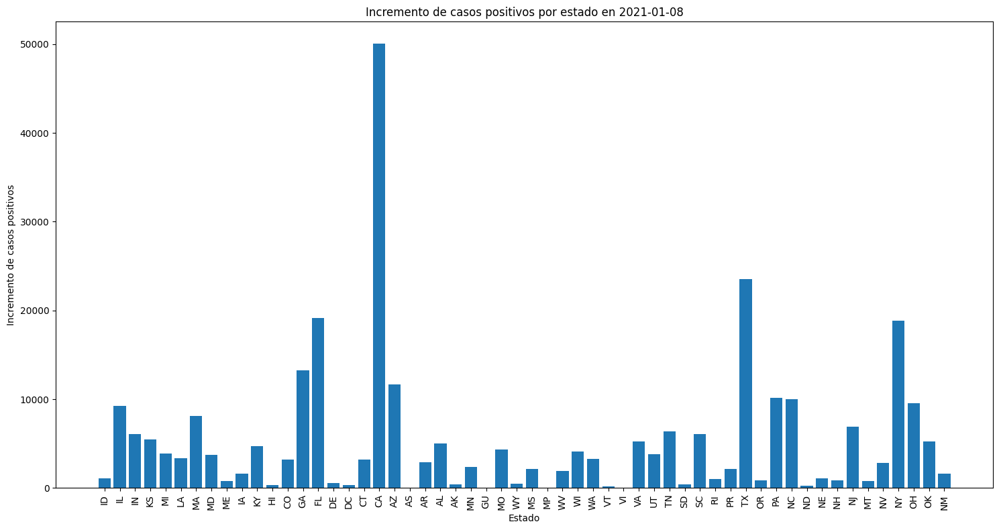

In [25]:
daily = df.copy()

daily['date'] = pd.to_datetime(daily['date'], format='%Y%m%d')


daily_increase = daily.groupby(daily['date'].dt.date)['positiveIncrease'].sum()


if not daily_increase.empty:
    
    max_increase_day = daily_increase.idxmax()

    
    max_day_data = daily[daily['date'].dt.date == max_increase_day]

    
    plt.figure(figsize=(15, 8))
    plt.bar(max_day_data['state'], max_day_data['positiveIncrease'])
    plt.title(f'Incremento de casos positivos por estado en {max_increase_day.strftime("%Y-%m-%d")}')
    plt.xlabel('Estado')
    plt.ylabel('Incremento de casos positivos')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
else:
    print("No hay datos para generar la gráfica.")

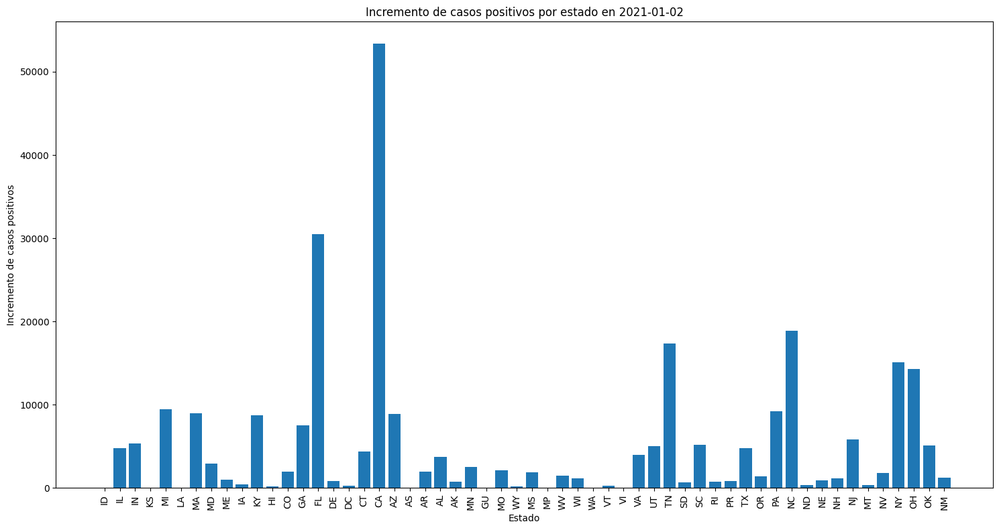

In [26]:
daily_increase = daily_increase.sort_values(ascending=False)

# Obtener el segundo día con el mayor incremento
second_max_increase_day = daily_increase.index[1]

# Filtrar los datos para el segundo día con el mayor incremento
second_max_day_data = daily[daily['date'].dt.date == second_max_increase_day]

# Crear la gráfica de barras
plt.figure(figsize=(15, 8))
plt.bar(second_max_day_data['state'], second_max_day_data['positiveIncrease'])
plt.title(f'Incremento de casos positivos por estado en {second_max_increase_day.strftime("%Y-%m-%d")}')
plt.xlabel('Estado')
plt.ylabel('Incremento de casos positivos')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [27]:
# Encontrar el índice del 11 de julio de 2020
july_11_2020 = pd.Timestamp('2020-07-11')
july_11_2020_position = daily_increase.index.get_loc(july_11_2020.date())

# Imprimir información sobre el 11 de julio de 2020
print(f"El 11 de julio de 2020, el incremento de casos positivos fue: {daily_increase[july_11_2020.date()]}")
print(f"Este día se encuentra en el puesto {july_11_2020_position + 1} de los días con mayor incremento de casos positivos.")

# Filtrar los datos para el 11 de julio de 2020
july_11_2020_data = daily[daily['date'].dt.date == july_11_2020.date()]



El 11 de julio de 2020, el incremento de casos positivos fue: 62584
Este día se encuentra en el puesto 147 de los días con mayor incremento de casos positivos.


In [28]:

max_increase = daily.groupby('date')['positiveIncrease'].max()

max_increase_day = max_increase.idxmax()

print(f"El día con el mayor incremento de casos positivos (2390) fue el {max_increase_day.strftime('%Y-%m-%d')}")

print("El estado con el mayor incremento en ese día fue:")
print(max_day_data.loc[max_day_data['positiveIncrease'].idxmax(), 'state'])

El día con el mayor incremento de casos positivos (2390) fue el 2020-11-01
El estado con el mayor incremento en ese día fue:
CA


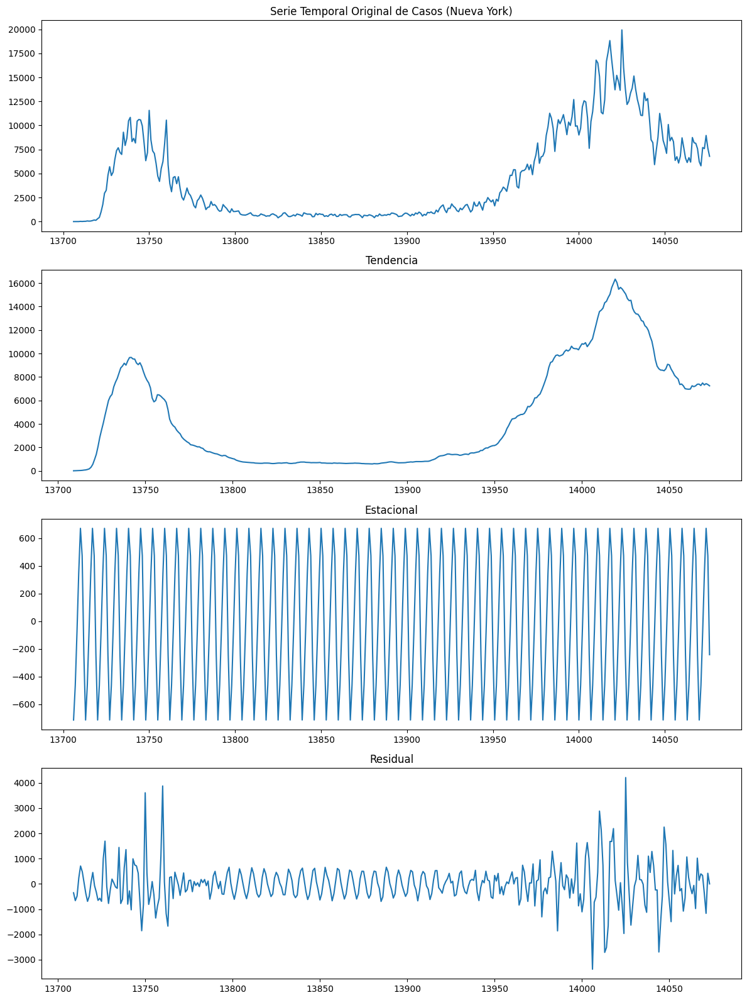

In [29]:
# Calcular promedios móviles para métricas clave
state_df['rolling_avg_cases'] = state_df.groupby('state')['positiveIncrease'].rolling(window=14).mean().reset_index(0, drop=True)
state_df['rolling_avg_deaths'] = state_df.groupby('state')['deathIncrease'].rolling(window=14).mean().reset_index(0, drop=True)

# Calcular tasa de positividad de pruebas
state_df['positivity_rate'] = state_df['positiveIncrease'] / state_df['totalTestResultsIncrease']


#  Realizar descomposición de series temporales
def decompose_time_series(state_data):
    result = seasonal_decompose(state_data['positiveIncrease'], model='additive', period=7)
    return pd.DataFrame({
        'tendencia': result.trend,
        'estacional': result.seasonal,
        'residual': result.resid
    })

# Ejemplo para un estado (por ejemplo, Nueva York)
ny_decomposition = decompose_time_series(state_df[state_df['state'] == 'NY'])


# Visualizar descomposición de series temporales para Nueva York
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 16))
ax1.plot(ny_decomposition.index, state_df[state_df['state'] == 'NY']['positiveIncrease'])
ax1.set_title('Serie Temporal Original de Casos (Nueva York)')
ax2.plot(ny_decomposition.index, ny_decomposition['tendencia'])
ax2.set_title('Tendencia')
ax3.plot(ny_decomposition.index, ny_decomposition['estacional'])
ax3.set_title('Estacional')
ax4.plot(ny_decomposition.index, ny_decomposition['residual'])
ax4.set_title('Residual')
plt.tight_layout()
plt.show()



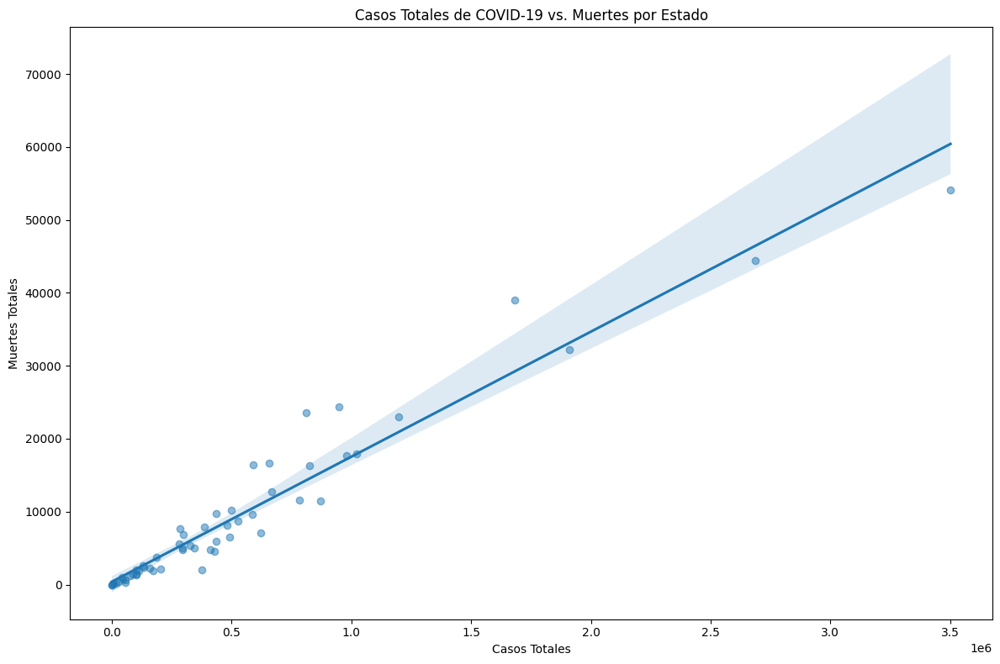

In [30]:
# Gráfico de dispersión de casos totales vs. muertes totales con línea de regresión
plt.figure(figsize=(12, 8))
sns.regplot(x='positive', y='death', data=state_summary, scatter_kws={'alpha':0.5})
plt.title('Casos Totales de COVID-19 vs. Muertes por Estado')
plt.xlabel('Casos Totales')
plt.ylabel('Muertes Totales')
plt.tight_layout()
plt.show()


# Análisis del Impacto del COVID-19 en EEUU durante el Periodo Ene 2020 - Mar 2021

## Resumen

Este análisis examina el impacto del COVID-19 en el primer año en Estados Unidos, centrándose en datos a nivel estatal sobre casos, muertes, hospitalizaciones y métricas relacionadas.

## Hallazgos Clave

1. **Distribución de Casos**: California, Texas, Florida y Nueva York aparecen constantemente como los estados con el mayor número total de casos. Esto se alinea con sus grandes poblaciones, pero también sugiere que estos estados enfrentaron desafíos significativos en el control de la propagación del virus.

2. **Número de Muertes**: Nueva York, California, Texas y Florida reportaron el mayor número de muertes. Notablemente, el número de muertes de Nueva York es desproporcionadamente alto en comparación con su número de casos, lo que indica una tasa de mortalidad potencialmente más alta o desafíos en la respuesta temprana a la pandemia. Ocurre lo mismo en estados fronterizos con NY, por ejemplo New Jersey.

3. **Hospitalizaciones**: Florida, Nueva Jersey y Arizona reportaron el mayor número de hospitalizaciones. Esto sugiere que estos estados pueden haber enfrentado una tensión particular en sus sistemas de atención médica.

4. **Tasa de Mortalidad**: La tasa de mortalidad (muertes/casos) varía significativamente entre los estados. Nueva Jersey, Massachusetts,
Nueva York y Pensilvania muestran tasas de mortalidad más altas, lo que podría deberse a factores como la densidad de población, la demografía de edad, la capacidad del sistema de atención médica o las estrategias de respuesta temprana a la pandemia.

5. **Tasas de Pruebas**: El análisis incluye las tasas de pruebas, lo que es crucial para comprender la verdadera propagación del virus. Los estados con tasas de pruebas más altas pueden inicialmente mostrar un mayor número de casos, pero podrían estar mejor posicionados para controlar la propagación a través de la detección temprana y el aislamiento.

6. **Tendencias de Series Temporales**: Las medias móviles de los nuevos casos muestran distintas ondas de infección, con picos y valles que varían según el estado. Esto sugiere diferentes líneas de tiempo de brote y esfuerzos de contención en los estados.

7. **Retraso Entre Casos y Muertes**: El análisis de la correlación de retraso entre casos y muertes proporciona información sobre la progresión típica de la enfermedad y la efectividad del tratamiento a lo largo del tiempo.

## Reseñas por Estados

1. **Nueva York**: Enfrentó un brote temprano severo con una alta tasa de mortalidad. La respuesta del estado evolucionó con el tiempo, lo que potencialmente mejoró los resultados en olas posteriores.

2. **California**: Alto número total de casos pero una tasa de mortalidad más baja en comparación con Nueva York, lo que sugiere una respuesta de atención médica potencialmente más efectiva o diferencias en la vulnerabilidad de la población.

3. **Florida**: Altos números de casos y hospitalizaciones, pero una tasa de mortalidad más baja que algunos otros estados fuertemente afectados. Esto podría indicar protocolos de tratamiento efectivos o diferencias en la población afectada.

4. **Texas**: Patrón similar a Florida con altos números de casos pero una tasa de mortalidad más baja que los estados de brote temprano.

5. **Nueva Jersey**: Alta tasa de mortalidad y hospitalizaciones significativas en relación con su población, lo que indica un impacto severo y una posible tensión en el sistema de atención médica.


## Conclusiones

El primer año de la pandemia de COVID-19 en EE. UU. reveló variaciones significativas en el impacto y la respuesta entre los estados. Si bien el tamaño de la población jugó un papel en el número total de casos, factores como el momento de la respuesta temprana, la capacidad del sistema de atención médica y la efectividad de las medidas de salud pública seguramente influyeron significativamente en los resultados.



## Documentación de la API y el significado de las columnas en  https://covidtracking.com/data/api
